# **Tarea 1: Aprendizaje Automático**

**Integrantes:**
* Yazmín Dominguez (yazmin.dominguez@usach.cl)
* Cristian Gonzalez Figueroa (cristian.gonzalez.figueroa@gmail.com)
* Cesar Deramond ( cderamond@gmail.com)
* Rodrigo Lira (rodrigo.lira@uai.cl)


- Entrega: Miércoles 23 de agosto.



Utilizaremos un dataset de vinos extraido desde el UCI Machine Learning Repository, el cual es una colección de bases de datos, teorías de dominio y
generadores de datos que utiliza la comunidad de machine learning para el análisis empírico de los algoritmos.

El dataset son el resultado de un análisis químico de vinos cultivados en la misma región de Italia pero derivados de tres cultivares diferentes.
El análisis determinó las cantidades de 13 constituyentes que se encuentran en cada uno de los tres tipos de vinos. Este dataset puede ser encontrado aquí:
https://archive.ics.uci.edu/dataset/186/wine+quality


Los dos conjuntos de datos están relacionados con variantes rojas y blancas del vino portugués "Vinho Verde".

1.- Importar las librerias necesarias para realizar análisis exploratorio (las utilizadas en el ejercicio en clase)

2.- Desplegar las primeras 5 filas del dataset de vinos rojos

3.- Desplegar las primeras 5 filas del dataset de vinos blancos

4.- Concatene (junte) ambos datasets, el de vinos rojos y el de vinos blancos (puede usar la función concat() de pandas)

5.- Despliegue la cantidad de valores faltantes/nulos por cada característica

6.- Despliegue el tipo de dato de cada característica/columna

7.- Despliegue un resumen de los estadísticos del dataset (puede usar la función describe sobre el dataframe)

El siguiente trozo de código permite desplegar gráficos de cajas de cada atributo (excepto wine type):


In [ ]:
# No graficaremos la variable categorica type_wine, ya que solo puede tomar dos valores
# create box plots
#fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(20,10))
#index = 0
#ax = ax.flatten()

#for col, value in df_wines.iloc[0:,0:-1].items():
#    if col != 'type':
#        sns.boxplot(y=col, data=df_wines.iloc[0:,0:-1], ax=ax[index])
#        index += 1
#plt.tight_layout(pad=0.5, w_pad=0.7, h_pad=5.0)

8.- ¿En cuál/cuáles atributos se observan outliers?

9.- Elimine los outliers usando el método IQR utilizado en el ejercicio de la primera clase.

10.- Ejecute nuevamente el código de visualización de gráficos de caja.

11.- ¿Puede observar outliers luego de la aplicacíón del método IQR?

12.- Despliegue gráficos Scatter entre el atributo "residual sugar" y cada uno de los siguientes: "volatile acidity", "chlorides", "sulphates", "density" y "alcohol".

13.- ¿Observa una correlación positiva entre "residual sugar" y alguno de los otros atributos? ¿cuáles? De haber más de uno, ¿cuál es el atributo que - visualmente- presenta una mayor correlación con "residual sugar"?

# 1.- Importar librerías necesarias

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns                       # para visualización
import matplotlib.pyplot as plt             # para visualización
%matplotlib inline
sns.set(color_codes=True)

# 2.- Desplegar las primeras 5 filas del dataset vinos rojo


1.   Carga el archivo "winequality-red.csv" en un DataFrame llamado df_red, utilizando el punto y coma como delimitador.
2.  Carga el archivo "winequality-white.csv" en un DataFrame llamado df_white, utilizando el punto y coma como delimitador.
3. Muestra las primeras 5 filas del DataFrame df_red, ofreciendo una vista previa de los datos contenidos en él.


In [ ]:
df_red = pd.read_csv("winequality-red.csv", delimiter=";")
df_white = pd.read_csv("winequality-white.csv", delimiter=";")
df_red.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# 3.- Desplegar las primeras 5 filas del dataset vinos blanco

Muestra las primeras 5 filas del DataFrame df_white, proporcionando una vista previa de los datos contenidos en el DataFrame que se cargó previamente a partir del archivo "winequality-white.csv".

In [ ]:
df_white.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.0,0.27,0.36,20.7,0.045,45.0,170.0,1.0010,3.00,0.45,8.8,6
1,6.3,0.30,0.34,1.6,0.049,14.0,132.0,0.9940,3.30,0.49,9.5,6
2,8.1,0.28,0.40,6.9,0.050,30.0,97.0,0.9951,3.26,0.44,10.1,6
3,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6
4,7.2,0.23,0.32,8.5,0.058,47.0,186.0,0.9956,3.19,0.40,9.9,6


# 4.- Concatenar ambos dataset



1.   Agrega una nueva columna llamada 'wine_type' al DataFrame df_red y asigna el valor 'red' a todas las filas de esta columna, indicando que estos datos corresponden a vinos tintos.
2.   Agrega una nueva columna llamada 'wine_type' al DataFrame df_white y asigna el valor 'white' a todas las filas de esta columna, indicando que estos datos corresponden a vinos blancos.
3. Combina los DataFrames df_red y df_white en un nuevo DataFrame llamado df_combined, ignorando los índices originales y creando un nuevo índice continuo. Esto une los datos de vinos tintos y vinos blancos en un solo DataFrame.
4. Muestra las primeras 5 filas del DataFrame df_combined, lo que proporciona una vista previa de los datos combinados que incluyen la información de vinos tintos y vinos blancos.



In [ ]:
df_red['wine_type'] = 'red'
df_white['wine_type'] = 'white'
df_combined = pd.concat([df_red, df_white], ignore_index=True)
df_combined.head(5)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,red
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,red
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,red
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,red


Muestra las últimas filas del DataFrame df_combined, lo que proporciona una vista previa de las últimas entradas de los datos combinados que incluyen información de vinos tintos y vinos blancos.

In [ ]:
df_combined.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,wine_type
6492,6.2,0.21,0.29,1.6,0.039,24.0,92.0,0.99114,3.27,0.50,11.2,6,white
6493,6.6,0.32,0.36,8.0,0.047,57.0,168.0,0.99490,3.15,0.46,9.6,5,white
6494,6.5,0.24,0.19,1.2,0.041,30.0,111.0,0.99254,2.99,0.46,9.4,6,white
6495,5.5,0.29,0.30,1.1,0.022,20.0,110.0,0.98869,3.34,0.38,12.8,7,white
6496,6.0,0.21,0.38,0.8,0.020,22.0,98.0,0.98941,3.26,0.32,11.8,6,white


# 5.- Valores Faltantes/Nulos por cada característica

La siguiente instrucción imprime la cantidad de valores nulos en cada columna del DataFrame combinado df_combined, lo que ayuda a evaluar la presencia de datos faltantes en el conjunto de datos.

In [ ]:
print(df_combined.isnull().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
wine_type               0
dtype: int64


No se visualizan valores faltatnes o nulos por cada caracteristica

# 6.- Tipo de dato de cada columna

La instrucción muestra los tipos de datos de cada columna en el DataFrame combinado df_combined, proporcionando información sobre cómo se almacenan y representan los valores en cada columna, como enteros, flotantes o cadenas de texto.

In [ ]:
df_combined.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
wine_type                object
dtype: object

Para simplificar el proceso de análisis, hemos incorporado la descripción de los atributos, junto con los rangos aceptables asociados a estos atributos para un vino de alta calidad. Estos detalles han sido obtenidos mediante la investigación de diversas páginas web, cuyas referencias se encuentran al final del documento, sirviendo así como una fuente de consulta de referencia.


Parámetros y su descripción:
1.   Acidez fija (Fixed Acidity):  Total de ácidos presentes en el vino, afecta el sabor y la estabilidad.
2.   Acidez volátil (Volatile Acidity): Concentración de ácidos volátiles, puede causar aromas desagradables.
3.Ácido cítrico (Citric Acid):Contribuye al sabor ácido, añade notas frescas y cítricas.
4.Azúcar residual (Residual Sugar): Cantidad de azúcar post-fermentación, influye en la dulzura percibida.
5.Cloruros (Chlorides):Sales de cloruro que afectan el sabor y la frescura.
6.Dióxido de azufre libre (Free Sulfur Dioxide):Conservante, previene oxidación y crecimiento microbiano.
7.Dióxido de azufre total (Total Sulfur Dioxide):Suma de formas libre y combinada, mide cantidad total.
8.Densidad:Masa por volumen, útil para determinar alcohol y azúcar.
9.pH: Medida de acidez/alcalinidad, afecta sabores y estabilidad química.
10.Sulfatos (Sulphates):Sales de ácido sulfúrico, previenen crecimiento no deseado.
11.Alcohol: Contenido alcohólico, influye en cuerpo y calidez.
12.Calidad (Quality): Evaluación subjetiva de la calidad global del vino, basada en sabor, aroma, equilibrio y complejidad.


"Además, es importante tener en cuenta los rangos aceptables asociados a cada una de estas variables. Estos rangos permiten una comprensión más profunda de las relaciones entre los distintos elementos. Al comprender los intervalos en los que cada variable se considera aceptable, se facilita la evaluación y el análisis de cómo interactúan y contribuyen al perfil de los vinos blancos y tintos. Estos rangos proporcionan una guía esencial para juzgar la calidad y las características deseables de los vinos, permitiendo a enólogos y catadores discernir las particularidades de cada muestra."

In [ ]:
!pip install tabulate
from tabulate import tabulate

data = [
    ["Acidez Fija", "g/L", "entre 5 y 9", "entre 4 y 8"],
    ["Acidez Volátil", "g/L", "< 0.6", "< 0.6"],
    ["Ácido Cítrico", "g/L", "0.2 - 1.0", "0.2 - 1.0"],
    ["Azúcar Residual", "g/L", "< 4", "< 4"],
    ["Cloruros", "g/L", "0.02 - 0.06", "0.02 - 0.06"],
    ["Dióxido de Azufre Libre", "mg/L", "20 - 50", "10 y 30"],
    ["Dióxido de Azufre Total", "mg/L", "100 - 200", "100 - 200"],
    ["Densidad", "g/mL", "0.990 - 1.010", "0.990 - 1.010"],
    ["pH", "-", "3.0 - 3.4", "3.4 - 3.8"],
    ["Sulfatos", "g/L", "0.5 - 1.5", "0.5 - 1.5"],
    ["Alcohol", "% vol", "9 y 14", "10 y 16"],
    ["Calidad", "-", "Subjetivo", "Subjetivo"]
]

headers = ["Parametro", "Unidad de Medida", "Vinos Blancos", "Vinos Tintos"]

table = tabulate(data, headers, tablefmt="grid")
print(table)



+-------------------------+--------------------+-----------------+----------------+
| Parametro               | Unidad de Medida   | Vinos Blancos   | Vinos Tintos   |
+=========================+====================+=================+================+
| Acidez Fija             | g/L                | entre 5 y 9     | entre 4 y 8    |
+-------------------------+--------------------+-----------------+----------------+
| Acidez Volátil          | g/L                | < 0.6           | < 0.6          |
+-------------------------+--------------------+-----------------+----------------+
| Ácido Cítrico           | g/L                | 0.2 - 1.0       | 0.2 - 1.0      |
+-------------------------+--------------------+-----------------+----------------+
| Azúcar Residual         | g/L                | < 4             | < 4            |
+-------------------------+--------------------+-----------------+----------------+
| Cloruros                | g/L                | 0.02 - 0.06     | 0.02 - 0.

# 7.- Estadísticos del dataset



1.  Se Calculan las estadísticas descriptivas para todas las columnas numéricas del DataFrame combinado df_combined y almacena los resultados en una variable llamada summary.

2.  Imprime en pantalla las estadísticas descriptivas calculadas previamente en el DataFrame summary, lo que proporciona una visión general de los valores estadísticos como la media, mediana, desviación estándar, valores mínimo y máximo, entre otros, para cada columna numérica del DataFrame combinado.

3. Las estadísticas que se muestran a continuación corresponden a:
*   count: Cantidad de valores no nulos en la columna.
*   mean: Valor promedio de la columna
*   std: Desviación estándar de la columna.
*   min: Valor mínimo en la columna.
*   25%: Primer cuartil (percentil 25) de la columna.
*	  50%: Mediana (percentil 50) de la columna.
*	  75%: Tercer cuartil (percentil 75) de la columna.
*	  max: Valor máximo en la columna.



In [ ]:
summary = df_combined.describe()
print(summary)

       fixed acidity  volatile acidity  citric acid  residual sugar  \
count    6497.000000       6497.000000  6497.000000     6497.000000   
mean        7.215307          0.339666     0.318633        5.443235   
std         1.296434          0.164636     0.145318        4.757804   
min         3.800000          0.080000     0.000000        0.600000   
25%         6.400000          0.230000     0.250000        1.800000   
50%         7.000000          0.290000     0.310000        3.000000   
75%         7.700000          0.400000     0.390000        8.100000   
max        15.900000          1.580000     1.660000       65.800000   

         chlorides  free sulfur dioxide  total sulfur dioxide      density  \
count  6497.000000          6497.000000           6497.000000  6497.000000   
mean      0.056034            30.525319            115.744574     0.994697   
std       0.035034            17.749400             56.521855     0.002999   
min       0.009000             1.000000         

A continuación se crean múltiples gráficos de caja en subplots para visualizar la distribución de los valores en las columnas numéricas del DataFrame df_combined. Cada gráfico se presenta en un diseño organizado y espaciado.

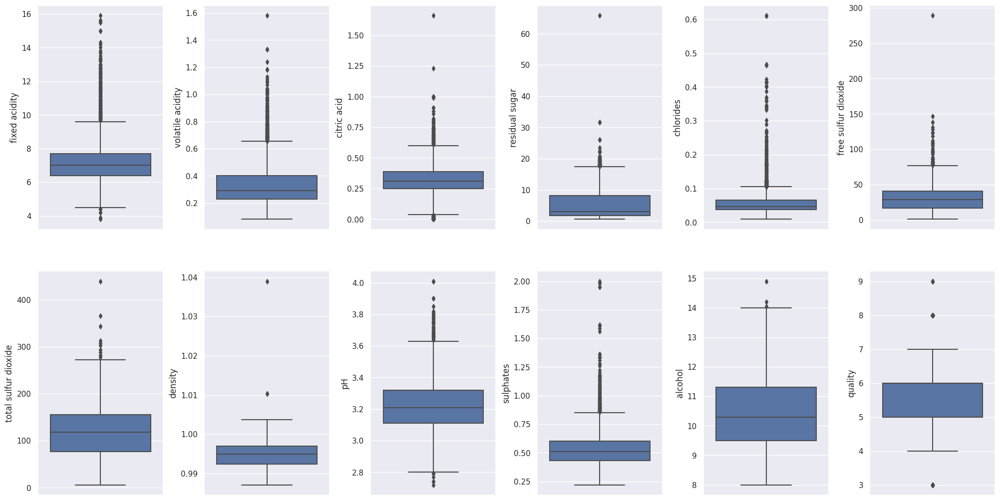

In [ ]:
# No graficaremos la variable categorica type_wine, ya que solo puede tomar dos valores
# create box plots
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(20,10))
index = 0
ax = ax.flatten()

for col, value in df_combined.iloc[0:,0:-1].items():
    if col != 'wine_type':
        sns.boxplot(y=col, data=df_combined.iloc[0:,0:-1], ax=ax[index])
        index += 1
plt.tight_layout(pad=0.5, w_pad=0.7, h_pad=5.0)

# 8.- Outliers

Se pueden identificar valores atípicos (outliers) en todos los atributos, los
cuales son puntos de datos que se desvían significativamente de la mayoría de los otros valores. Sin embargo, algunos atributos muestran estos valores extremos de manera menos pronunciada, como es el caso de:

* 1."Density"
* 2."Alcohol" y
* 3."Quality".

# 9.- Eliminando Outliers



1.  Calculamos el primer cuartil (25%) para las columnas numéricas del DataFrame df_combined y almacena los resultados en una variable llamada Q1.
2.	Calculamos el tercer cuartil (75%) para las columnas numéricas del DataFrame df_combined y almacena los resultados en una variable llamada Q3.
3.	Se Calcula el rango intercuartil (IQR) para cada columna numérica, restando el tercer cuartil (Q3) al primer cuartil (Q1), y almacena los resultados en una variable llamada IQR.(IQR = Q3 - Q1)
4.	Se imprime en pantalla los valores del rango intercuartil (IQR) calculados previamente para cada columna numérica, proporcionando información sobre la dispersión intercuartil de los datos en cada columna




In [ ]:
# Evitamos el FutureWarning:
Q1 = df_combined.select_dtypes(include=['number']).quantile(0.25)
Q3 = df_combined.select_dtypes(include=['number']).quantile(0.75)

IQR = Q3 - Q1
print(IQR)

fixed acidity            1.30000
volatile acidity         0.17000
citric acid              0.14000
residual sugar           6.30000
chlorides                0.02700
free sulfur dioxide     24.00000
total sulfur dioxide    79.00000
density                  0.00465
pH                       0.21000
sulphates                0.17000
alcohol                  1.80000
quality                  1.00000
dtype: float64


1.	Se crea un nuevo DataFrame df que excluye las filas de df_combined que contienen valores extremos (outliers) en al menos una columna numérica, utilizando los criterios del rango intercuartil (IQR) multiplicado por 1.5 para definir los límites aceptables.
2.	Se Imprime la forma (número de filas y columnas) del DataFrame resultante df, lo que proporciona información sobre la cantidad de filas y columnas después de haber eliminado los outliers.


In [ ]:
#df = df_combined[~((df_combined < (Q1 - 1.5 * IQR)) |(df_combined > (Q3 + 1.5 * IQR))).any(axis=1)]
#df.shape

# (Código que elimina FutureWarning)
# Alinemos el DataFrame y las Series
df_aligned, Q1_aligned = df_combined.align(Q1, axis=1, copy=False)
_, IQR_aligned = df_combined.align(IQR, axis=1, copy=False)
_, Q3_aligned = df_combined.align(Q3, axis=1, copy=False)

# Ahora, usemos los valores alineados para la comparación y el filtrado
df = df_combined[~((df_aligned < (Q1_aligned - 1.5 * IQR_aligned)) | (df_aligned > (Q3_aligned + 1.5 * IQR_aligned))).any(axis=1)]
df.shape

(4840, 13)

En un inicio, el conjunto de datos contaba con 6.497 filas, y después de aplicar el proceso, ahora se encuentra con 4.840 filas.

# 10.- Visualización de Outliers nuevamente

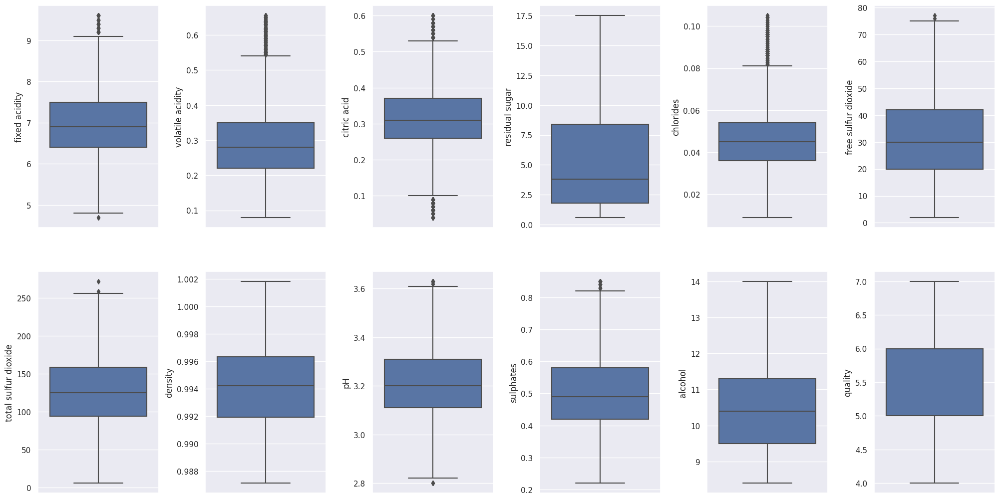

In [ ]:
# No graficaremos la variable categorica type_wine, ya que solo puede tomar dos valores
# create box plots
fig, ax = plt.subplots(ncols=6, nrows=2, figsize=(20,10))
index = 0
ax = ax.flatten()

for col, value in df.iloc[0:,0:-1].items():
    if col != 'wine_type':
        sns.boxplot(y=col, data=df.iloc[0:,0:-1], ax=ax[index])
        index += 1
plt.tight_layout(pad=0.5, w_pad=0.7, h_pad=5.0)

# 11.- Visualización de Outliers

Se han categorizado las correcciones de valores atípicos en tres niveles:

**Corrección Pronunciada:**

Se logró una corrección prácticamente total en los siguientes atributos:
*  Residual sugar
*  Density
*  Alcohol
*  Quality

**Corrección Media:**

Se alcanzó una corrección significativa, con muy pocos valores atípicos remanentes, en los siguientes atributos:

*  Fixed acidity
*  Free sulfur dioxide
*  Total sulfur dioxide
*  PH
*  Sulphates

**Corrección Menor:**

Aunque aún persisten algunos datos atípicos, su presencia es ahora mucho menor tras aplicar el método IQR, en los siguientes atributos:

*  Volatile acidity
*  Citric acid
*  Chlorides


Estas categorías reflejan el nivel de mejora logrado en la eliminación de *  valores atípicos para cada atributo.


# 12.- Gráficos Scatter

Los siguientes codigos generan gráficos de dispersión (scatterplot) para explorar una posible correlación entre las variables "residual sugar" y "volatile acidity", mostrando cómo se distribuyen los puntos en un plano y estableciendo las etiquetas de los ejes correspondientes.

**Relación entre Residual Sugar y Volatile Acidity**



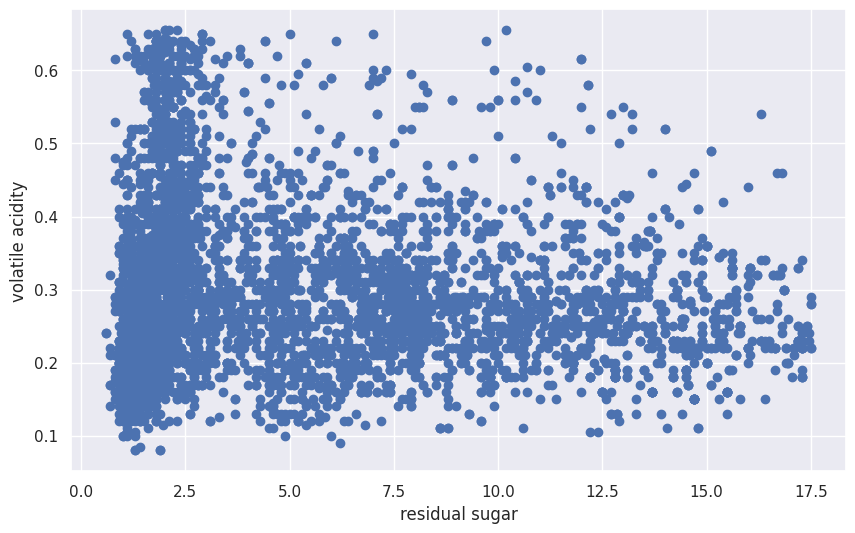

In [ ]:
#Scatterplot: para encontrar posible correlación entre variables:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['residual sugar'], df['volatile acidity'])
ax.set_xlabel('residual sugar')
ax.set_ylabel('volatile acidity')
plt.show()

En este caso no suele haber una correlación positiva fuerte entre "residual sugar" (azúcar residual) y "volatile acidity" (acidez volátil). Por lo general, estos dos atributos tienden a tener una relación inversa. Los vinos con altos niveles de azúcar residual tienden a tener una acidez volátil más baja, y viceversa. Esto es porque el azúcar residual puede actuar como un amortiguador para atenuar los sabores y aromas desagradables asociados con altos niveles de acidez volátil.

**Relación entre Residual Sugar y chlorides**

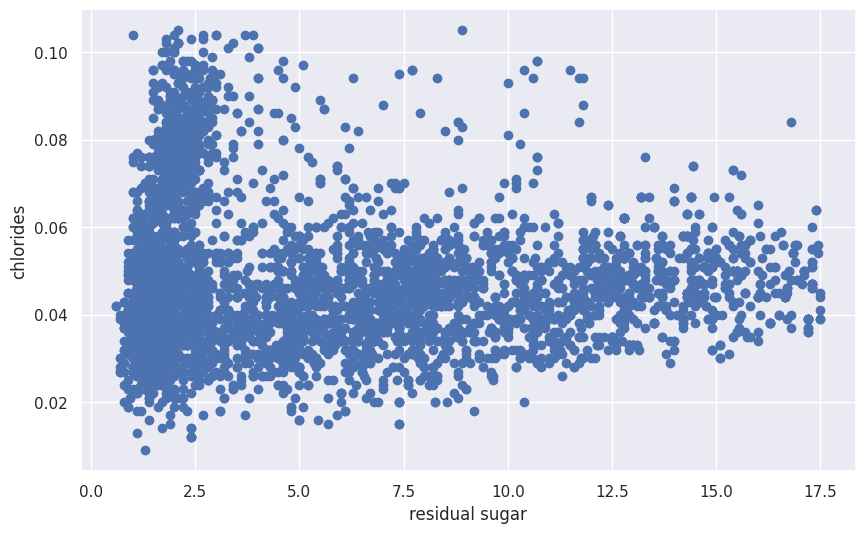

In [ ]:
#Scatterplot: para encontrar posible correlación entre variables:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['residual sugar'], df['chlorides'])
ax.set_xlabel('residual sugar')
ax.set_ylabel('chlorides')
plt.show()

La relación entre "residual sugar" y "Chlorides" es moderada, influenciando la percepción del sabor y la sensación en boca del vino.

**Relación entre Residual Sugar y sulphates**

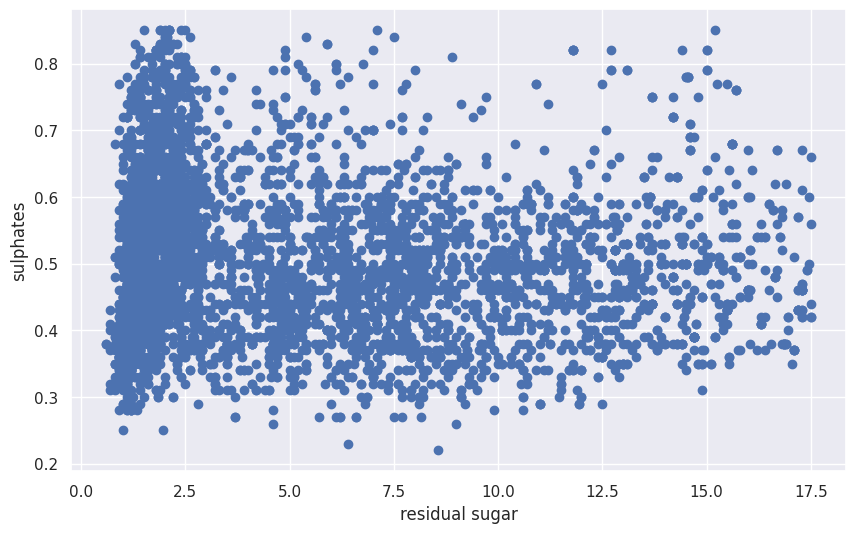

In [ ]:
#Scatterplot: para encontrar posible correlación entre variables:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['residual sugar'], df['sulphates'])
ax.set_xlabel('residual sugar')
ax.set_ylabel('sulphates')
plt.show()

En términos generales, no se observa una correlación positiva fuerte entre "residual sugar" (azúcar residual) y "sulphates" (sulfatos). Aunque los sulfatos pueden influir en la percepción del sabor y la estructura del vino, no hay una relación directa y predecible entre los niveles de azúcar residual y sulfatos en la mayoría de los casos.

**Relación entre Residual Sugar y Density**

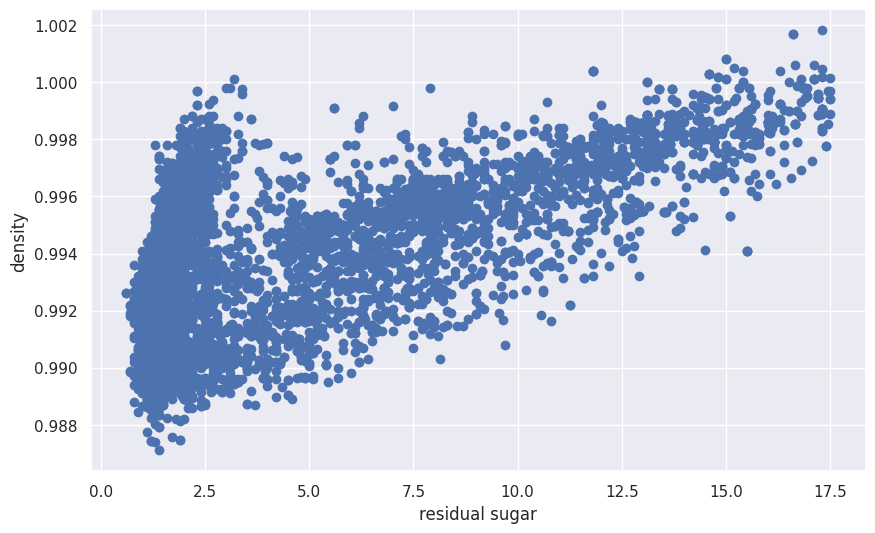

In [ ]:
#Scatterplot: para encontrar posible correlación entre variables:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['residual sugar'], df['density'])
ax.set_xlabel('residual sugar')
ax.set_ylabel('density')
plt.show()

Sí, existe una correlación positiva entre "residual sugar" (azúcar residual) y "density" (densidad) en el vino. Cuanto mayor sea el nivel de azúcar residual, es probable que la densidad del vino también sea mayor. Esto se debe a que el azúcar añade masa al líquido, lo que aumenta su densidad.

**Relación entre Residual Sugar y Alcohol**

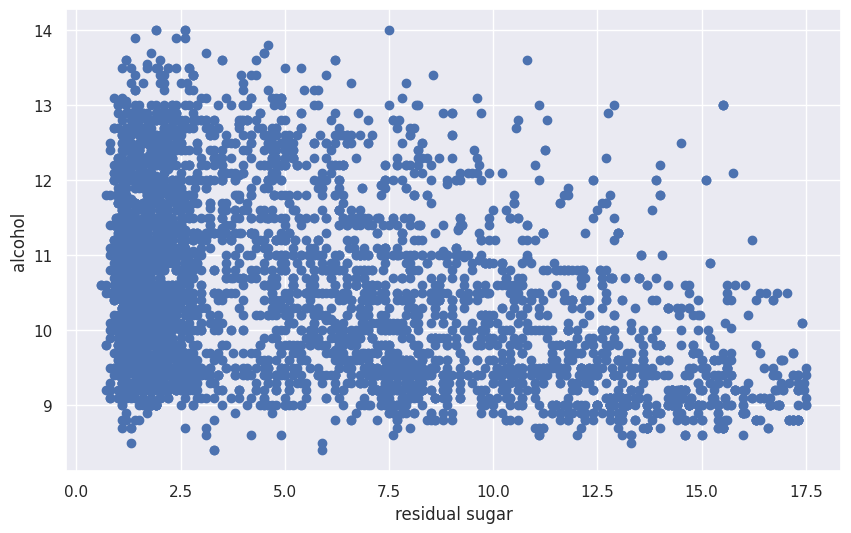

In [ ]:
#Scatterplot: para encontrar posible correlación entre variables:
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df['residual sugar'], df['alcohol'])
ax.set_xlabel('residual sugar')
ax.set_ylabel('alcohol')
plt.show()

En general, no existe una correlación fuerte y directa entre "residual sugar" (azúcar residual) y "alcohol" en el vino. Estos dos atributos tienden a estar equilibrados, pero no necesariamente hay una correlación positiva o negativa clara entre ellos. La relación entre azúcar residual y alcohol depende en gran medida del estilo del vino (dulce o seco) y las decisiones del enólogo durante el proceso de elaboración. En algunos casos, vinos dulces pueden tener niveles moderados de alcohol para mantener el equilibrio, mientras que vinos secos podrían tener niveles más altos de alcohol para contrarrestar la falta de dulzor.

# 13.- Correlación entre "residual sugar" y demás atributos

**13.1 ¿Observa una correlación positiva entre "residual sugar" y alguno de los otros atributos? ¿cuáles? De haber más de uno, ¿cuál es el atributo que - visualmente- presenta una mayor correlación con "residual sugar"?**

**Respuesta:**

*  Visualmente al analizar los graficos señalados anteriormente se identifica una correlación positiva de "residual sugar" con "chlorides" y "density".

*  La mayor correlación se visualiza con el atributo "density" y al revisar el mapa de calor mas abajo se puede corroborar con el valor de "0.65". La relación entre los atributos "residual sugar" (azúcar residual) y "density" (densidad) en el vino está relacionada con la concentración de azúcar en el vino y su influencia en la densidad del líquido. El azúcar residual es la cantidad de azúcar que permanece en el vino después de la fermentación. Cuanto mayor sea el contenido de azúcar residual en el vino, mayor será la densidad del líquido, ya que el azúcar añade masa al vino. Por lo tanto, en general, es posible observar una relación positiva entre estas dos parametros.

*  La relación entre "residual sugar" y "Chlorides" es moderada, influenciando la percepción del sabor y la sensación en boca del vino.
Los cloruros, como sales, afectan la percepción del sabor y frescura del vino, contribuyendo a un perfil equilibrado y sensación fresca.
El equilibrio entre azúcar residual y cloruros influye en la percepción de dulzura y sensación en boca; niveles altos de ambos pueden resaltar dulzura y suavidad en el vino.

*  Ahora sin visualizr los graficos anterior y analizar la matriz tenemos que residual sugar despues de densidad, existe una correlacion de 0.48 y 0.42 con el total sulfure dioxide y free sulfure dioxide dado que estos dos ultimos atributos están relacionados con el contenido de azufre en el vino, actuando como conservantes y antioxidantes.El equilibrio entre azúcar residual y contenido de azufre puede influir en la percepción del sabor, frescura y estabilidad del vino.






A continuación se genera la matriz de correlacionar para robustecer el análisis.

1.	Se configura el tamaño de la figura para el mapa de calor (heat map) a 10 unidades de ancho por 5 unidades de alto.
2.	Se calcula la matriz de correlación entre las variables del DataFrame df y se almacena en la variable c.
3.	Se crea un mapa de calor utilizando la matriz de correlación c, utilizando la paleta de colores "BrBG" y mostrando los valores de correlación en cada celda.


<Axes: >

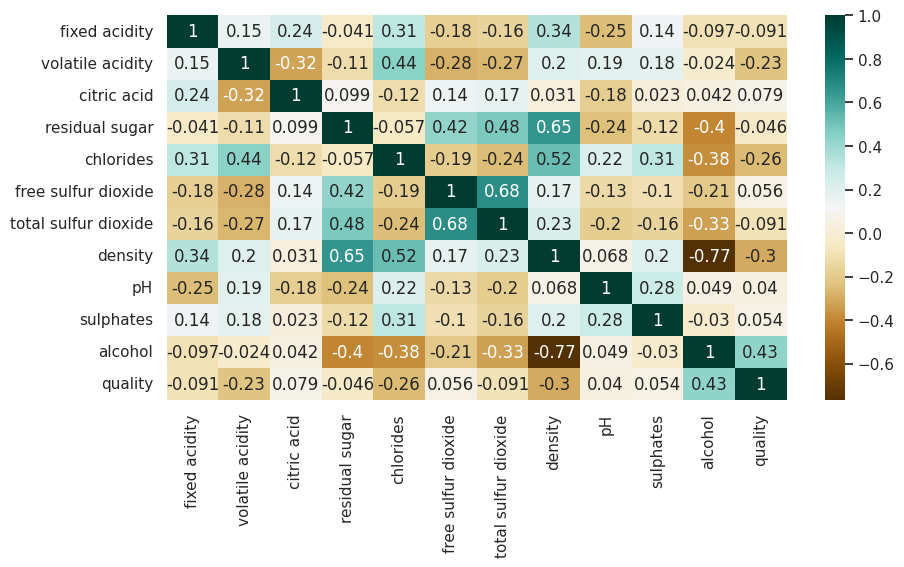

In [ ]:
#Heat Map: para encontrar relaciones entre variables:
plt.figure(figsize=(10,5))
#c = df.corr()
#Se corrige el FutureWarning
c = df.corr(numeric_only=True)
sns.heatmap(c,cmap="BrBG",annot=True)
#c

## Normalizar con minmax


Este código introduce la función norm_minmax, que implementa la normalización Min-Max en un DataFrame utilizando la biblioteca sklearn. La normalización ajusta los valores numéricos dentro de un rango específico, típicamente entre 0 y 1, manteniendo las relaciones entre ellos. Después de normalizar, la función reorganiza el DataFrame para combinar columnas normalizadas con las no numéricas. Al ejecutar esta función, el DataFrame original es normalizado y almacenado como df_norm. Esta técnica es útil en la preparación de datos para algoritmos de aprendizaje automático.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def norm_minmax(df):
  """Normalizes a dataframe using minmax normalization with sklearn.
  Returns:
    The normalized dataframe.
  """
  numeric_columns = df.select_dtypes(include=["int64", "float64"]).columns
  scaler = MinMaxScaler()
  normalized_df = scaler.fit_transform(df[numeric_columns].values)
  normalized_df = pd.DataFrame(normalized_df, columns=numeric_columns)

  non_numeric_columns = list(set(df.columns) - set(numeric_columns))
  excluded_df = df[non_numeric_columns].copy()
  normalized_df = pd.concat([normalized_df, excluded_df], axis=1)

  return normalized_df

df_norm = norm_minmax(df)

La normalización es útil en el preprocesamiento de datos para asegurarse de que todas las variables tengan el mismo rango, lo que puede ser beneficioso para algoritmos de aprendizaje automático que pueden ser sensibles a las diferencias en escalas de características. Normalizar los datos puede mejorar la convergencia de los modelos y evitar que ciertas características dominen sobre otras debido a sus escalas originales.

Matriz dispersión

A continuación se genera una matriz de gráficos de dispersión (scatter plots) que muestra las relaciones entre las variables numéricas del DataFrame df_norm. Cada gráfico de dispersión muestra la relación entre dos variables, y el parámetro hue se utiliza para diferenciar los puntos por colores según los valores de la columna "wine_type", lo que facilita la identificación de patrones y relaciones en los datos en función de la categoría de tipo de vino.

### Observaciones
* La diagonal nos indica que prácticamente todas las variables tienen distribuciones comparables y centradas igualmente.
* en densidad se observa sesgo opuesto.
* la curtosis en todos los casos es alta en los vinos blancos.

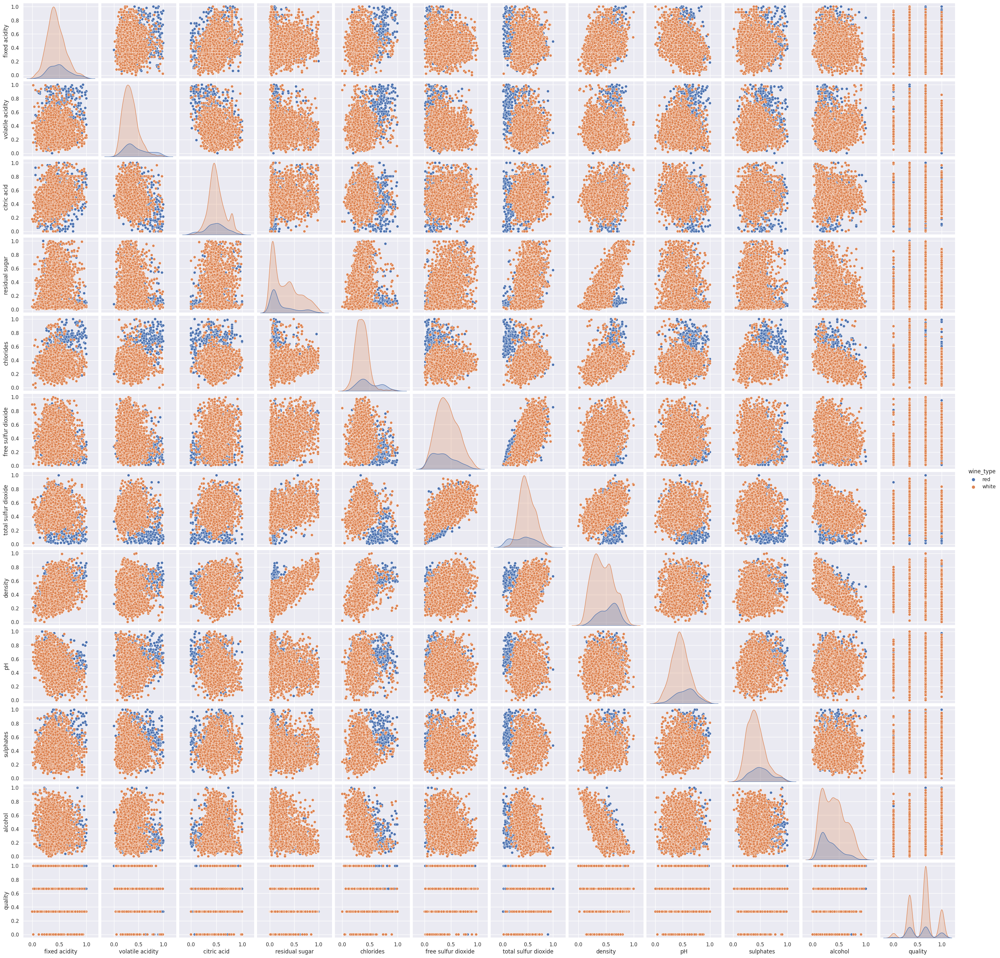

In [ ]:
#graph
sns.pairplot(df_norm, hue="wine_type")

*REFERENCIAS*


1.Labo Aragón. (s.f.). Enología Manual de Técnicas. Recuperado de: https://laboaragon.com/docs/marcas/panreac/Enologia%20Manual%20de%20Tecnicas.pdf



2. Aprender de Vino. (s.f.). pH y Vino. Recuperado de: https://www.aprenderdevino.es/ph-y-vino/